<a href="https://colab.research.google.com/github/interngithub2020/RF_modulation_classification/blob/master/dataset_visualisations.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from sklearn.externals import joblib
import os
from scipy.stats import gaussian_kde
import cv2
import pickle
import numpy as np
import matplotlib.pyplot as plt
import seaborn


plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Introduction-and-aims-of-this-notebook" data-toc-modified-id="Introduction-and-aims-of-this-notebook-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Introduction and aims of this notebook</a></span><ul class="toc-item"><li><span><a href="#radioML-datasets" data-toc-modified-id="radioML-datasets-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>radioML datasets</a></span></li><li><span><a href="#Matlab-dataset" data-toc-modified-id="Matlab-dataset-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>Matlab dataset</a></span></li><li><span><a href="#Different-data-representations" data-toc-modified-id="Different-data-representations-1.3"><span class="toc-item-num">1.3&nbsp;&nbsp;</span>Different data representations</a></span></li></ul></li><li><span><a href="#Understanding-2016-radioML-datasets" data-toc-modified-id="Understanding-2016-radioML-datasets-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Understanding 2016 radioML datasets</a></span><ul class="toc-item"><li><span><a href="#Difference-in-constellation-diagrams-for-2016.10A-and-2016.04C" data-toc-modified-id="Difference-in-constellation-diagrams-for-2016.10A-and-2016.04C-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Difference in constellation diagrams for 2016.10A and 2016.04C</a></span></li><li><span><a href="#Clarity-of-constellation-at-different-SNRs" data-toc-modified-id="Clarity-of-constellation-at-different-SNRs-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Clarity of constellation at different SNRs</a></span></li><li><span><a href="#Clarity-of-constellation-with-different-number-of-points" data-toc-modified-id="Clarity-of-constellation-with-different-number-of-points-2.3"><span class="toc-item-num">2.3&nbsp;&nbsp;</span>Clarity of constellation with different number of points</a></span></li><li><span><a href="#Closer-look-at-each-modulation-scheme" data-toc-modified-id="Closer-look-at-each-modulation-scheme-2.4"><span class="toc-item-num">2.4&nbsp;&nbsp;</span>Closer look at each modulation scheme</a></span><ul class="toc-item"><li><span><a href="#Digital-modulation" data-toc-modified-id="Digital-modulation-2.4.1"><span class="toc-item-num">2.4.1&nbsp;&nbsp;</span>Digital modulation</a></span></li><li><span><a href="#Problems-with-analogue-signals-dataset" data-toc-modified-id="Problems-with-analogue-signals-dataset-2.4.2"><span class="toc-item-num">2.4.2&nbsp;&nbsp;</span>Problems with analogue signals dataset</a></span><ul class="toc-item"><li><span><a href="#Analogue-further-investigation-in-time-domain" data-toc-modified-id="Analogue-further-investigation-in-time-domain-2.4.2.1"><span class="toc-item-num">2.4.2.1&nbsp;&nbsp;</span>Analogue further investigation in time domain</a></span></li></ul></li></ul></li><li><span><a href="#View-modulations-in-I/Q-time-domain" data-toc-modified-id="View-modulations-in-I/Q-time-domain-2.5"><span class="toc-item-num">2.5&nbsp;&nbsp;</span>View modulations in I/Q time domain</a></span></li><li><span><a href="#View-Amplitude-and-Phase-in-time" data-toc-modified-id="View-Amplitude-and-Phase-in-time-2.6"><span class="toc-item-num">2.6&nbsp;&nbsp;</span>View Amplitude and Phase in time</a></span></li><li><span><a href="#View-power-density-spectra" data-toc-modified-id="View-power-density-spectra-2.7"><span class="toc-item-num">2.7&nbsp;&nbsp;</span>View power density spectra</a></span></li></ul></li><li><span><a href="#Quick-visualisation-of-2018-radioML-dataset" data-toc-modified-id="Quick-visualisation-of-2018-radioML-dataset-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Quick visualisation of 2018 radioML dataset</a></span></li><li><span><a href="#Matlab-dataset" data-toc-modified-id="Matlab-dataset-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Matlab dataset</a></span><ul class="toc-item"><li><span><a href="#Ｅasy-dataset" data-toc-modified-id="Ｅasy-dataset-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>Ｅasy dataset</a></span></li><li><span><a href="#Medium-dataset" data-toc-modified-id="Medium-dataset-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>Medium dataset</a></span></li><li><span><a href="#Hard-dataset" data-toc-modified-id="Hard-dataset-4.3"><span class="toc-item-num">4.3&nbsp;&nbsp;</span>Hard dataset</a></span></li></ul></li><li><span><a href="#New-representation:-coloured-constellation-density-plots" data-toc-modified-id="New-representation:-coloured-constellation-density-plots-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>New representation: coloured constellation density plots</a></span></li><li><span><a href="#Another-representation---Graph-network" data-toc-modified-id="Another-representation---Graph-network-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Another representation - Graph network</a></span><ul class="toc-item"><li><span><a href="#Trying-to-get-a-good-thresh-for-top-1.5%-closest-distances" data-toc-modified-id="Trying-to-get-a-good-thresh-for-top-1.5%-closest-distances-6.1"><span class="toc-item-num">6.1&nbsp;&nbsp;</span>Trying to get a good thresh for top 1.5% closest distances</a></span></li><li><span><a href="#Convert-time-series-to-adjacency-matrix" data-toc-modified-id="Convert-time-series-to-adjacency-matrix-6.2"><span class="toc-item-num">6.2&nbsp;&nbsp;</span>Convert time-series to adjacency matrix</a></span></li></ul></li></ul></div>

# Introduction and aims of this notebook 

This notebook explains and visualises various synthetic radio modulation datasets, in different forms of data representations. Data visualisation is important because it helps us notice problems with the dataset, and also gives us some intuition on how models will perform.

## radioML datasets

The radioML datasets developed by DeepSig (available https://www.deepsig.ai/datasets) are commonly used as benchmarks in academia for the task of radio signal modulation classification. There are three radioML datasets, RADIOML 2016.04C, RADIOML 2016.10A and RADIOML 2018.01A. These three datasets were generated using GNU Radio, and details about how they were generated can be found in their corresponding papers: 2016 radioML dataset: [Radio Machine Learning Dataset Generation with GNU Radio](https://pubs.gnuradio.org/index.php/grcon/article/view/11); 2018 radioML dataset: [Over-the-Air Deep Learning Based Radio Signal Classification](https://arxiv.org/pdf/1712.04578.pdf).

This notebook visualises all three datasets, but eventually, only RADIOML 2016.10A was used in this project as it was a more normalised and cleaner version of RADIOML 2016.04C. The 2018 dataset contained more classes of modulation but data exploration revealed that the labels were wrong and I was not able to find the correct labelling.

RADIOML 2016.10A contains 11 modulation classes (8 digital + 3 analog). This is a variable-SNR dataset with moderate LO drift, light fading, and numerous different labeled SNR increments for use in measuring performance across different signal and noise power scenarios. However, the exact channel noise introduced is not known.

## Matlab dataset

I also created another dataset using Matlab's communication toolbox following this [Matlab tutorial](https://www.mathworks.com/help/deeplearning/ug/modulation-classification-with-deeplearning.html#ModulationClassificationWithDeepLearningExample-2) to assess how models that worked well on the radioML dataset would perform on a noisier and more realistic dataset, and also how well a model trained on a clean dataset would adapt to another noisier dataset.

The Matlab dataset contains 8 digital modulation classes same as that in RADIOML 2016.10A. I attempted to simulate real-life channel models in open urban spaces with Rician fading, clock offset and Doppler effect, with exact numbers as explained in the [Matlab tutorial](https://www.mathworks.com/help/deeplearning/ug/modulation-classification-with-deeplearning.html#ModulationClassificationWithDeepLearningExample-2). The end result is much noiser than that of the radioML dataset which will be shown later.

## Different data representations
This notebook presents visualisations of the raw I/Q modulation time-series data and various other data representations, such as amplitude-phase time-series and constellation diagrams. This project also attempts to find out which data representation leads to the best classification result.

# Understanding 2016 radioML datasets

Download 2016.04C and 2016.10A datasets here: https://www.deepsig.ai/datasets

In [ ]:
with open('data/2016.04C.multisnr.pkl','rb') as f:
  data = pickle.load(f,encoding='bytes')

with open('data/RML2016.10a_dict.pkl','rb') as f:
  data2 = pickle.load(f,encoding='bytes')

The datasets are python dictionaries, with key as (mod, SNR) and value as an array of 2x128 multi-variate time-series. The dictionary keys are printed below.
The 11 modulations are: BPSK, QPSK, 8PSK, PAM4, QAM16, QAM64, GFSK, CPFSK, AM-SSB, AM-DSB, WBFM. To understand more about modulation schemes, the [Wikipedia page on modulation](https://en.wikipedia.org/wiki/Modulation) is a good starting point.

In [ ]:
print(data.keys() == data2.keys())
print(data.keys())

True
dict_keys([(b'PAM4', 2), (b'AM-SSB', -2), (b'8PSK', 12), (b'AM-SSB', -12), (b'CPFSK', 12), (b'GFSK', -18), (b'PAM4', -14), (b'AM-DSB', 10), (b'CPFSK', -2), (b'QAM16', 2), (b'QAM16', -20), (b'CPFSK', 18), (b'AM-SSB', 12), (b'BPSK', 8), (b'AM-DSB', 16), (b'8PSK', 14), (b'GFSK', 0), (b'QAM64', 8), (b'QAM64', -14), (b'QPSK', -12), (b'PAM4', -8), (b'BPSK', -6), (b'AM-SSB', -18), (b'QAM16', 12), (b'QAM16', -10), (b'WBFM', -20), (b'AM-DSB', -16), (b'AM-DSB', -20), (b'PAM4', 8), (b'8PSK', 4), (b'CPFSK', -14), (b'QAM64', 18), (b'QAM64', -4), (b'GFSK', -6), (b'8PSK', -12), (b'8PSK', -16), (b'BPSK', -16), (b'WBFM', 2), (b'CPFSK', 6), (b'AM-DSB', -6), (b'AM-DSB', 4), (b'CPFSK', -8), (b'QPSK', -10), (b'AM-SSB', 6), (b'BPSK', 14), (b'QPSK', 18), (b'GFSK', -16), (b'GFSK', 6), (b'QAM64', 2), (b'QAM64', -20), (b'GFSK', 18), (b'WBFM', 12), (b'PAM4', -10), (b'AM-DSB', 14), (b'AM-SSB', -16), (b'QAM16', 6), (b'QAM16', -16), (b'WBFM', -10), (b'BPSK', 4), (b'PAM4', 6), (b'8PSK', 2), (b'QAM64', 12), (b'Q

Dataset sizes:

In [ ]:
print('2016.04C has', data[(b'AM-SSB', 0)].shape[0], 'data samples for each (mod, snr) with shape', data[(b'AM-SSB', 0)].shape)
print('2016.10A has', data2[(b'AM-SSB', 0)].shape[0], 'data samples for each (mod, snr) with shape', data2[(b'AM-SSB', 0)].shape)

2016.04C has 705 data samples for each (mod, snr) with shape (705, 2, 128)
2016.10A has 1000 data samples for each (mod, snr) with shape (1000, 2, 128)


Each data sample is in I/Q form, with 128 points in time sequence. One data sample looks like this:

In [ ]:
#e.g. of one sample
print(data[(b'AM-SSB', 0)][0])

[[-6.31792486e-01  7.52666414e-01 -1.93963856e-01 -7.04775095e-01
  -6.62435472e-01 -8.79732430e-01  1.00108242e+00 -4.07777399e-01
  -3.54912996e-01  3.68059486e-01  1.72208762e+00 -4.53350246e-01
  -8.72473121e-01 -2.15768009e-01 -7.13470280e-01 -5.69280684e-01
  -1.81597129e-01  1.62902191e-01 -1.02508299e-01  2.79202968e-01
   7.46626198e-01 -8.54534090e-01 -4.45021451e-01  2.18842939e-01
   1.05738211e+00  4.80537653e-01 -2.45667845e-02 -2.97923535e-02
  -1.22630939e-01 -1.12924004e+00 -1.20135117e+00  6.91938281e-01
   6.27420247e-01  5.84598362e-01  1.29789412e+00 -6.86195672e-01
   2.96046913e-01 -1.17657137e+00 -1.41225791e+00  3.77543569e-01
   4.72659200e-01  5.58678031e-01 -7.90512621e-01  3.97573024e-01
  -4.59090978e-01  4.05095607e-01 -1.02827632e+00  4.54754084e-01
  -6.03128850e-01 -4.99943167e-01  4.05116886e-01  5.29160619e-01
  -1.18192601e+00  6.39527261e-01  3.31714272e-01  2.48913348e-01
  -8.02490234e-01 -4.47899103e-01 -2.91061163e-01 -6.80259883e-01
  -4.46980

## Difference in constellation diagrams for 2016.10A and 2016.04C

Data in I/Q format is more effectively viewed with 2D constellation plots (inphase component as x-axis, quadrature as y-axis), which is unique for each modulation scheme. However, at low SNRs, the constellation plots are indistinguishable by human eye. Also, the greater the number of data points, the more distinguishable the constellation.

We also observe that the 2016.04C dataset is not normalised properly, with QAM16 and QAM64 occupying a much greater range in values than othe modulation types, while 2016.10A data are all within +-0.02 for both axes. This is why papers training on the 2016.04C dataset do not face confusion between QAM and 8PSK, while papers training on the 2016.10A dataset face this issue. 

In [ ]:
def plot_constellation(dataset, mod, snr, num128pts=1, offset=0, scale=False):
  modtype = dataset[(mod, snr)]
  points_i = []
  points_q = []
  points = [points_i, points_q]
  for i in range(num128pts):
    for j in range(128):
      points[0].append(modtype[i + offset][0][j])
      points[1].append(modtype[i + offset][1][j])

  marksz = max(0.01, 3/num128pts)
  plt.plot(points[0], points[1], '.', markersize=marksz)
  plt.title(str(mod)[1:] + str(snr))
  plt.tight_layout()
  if (scale):
        plt.xlim(-0.02, 0.02)
        plt.ylim(-0.02, 0.02)
        plt.gca().set_aspect('equal', adjustable='box')
  return points

2016.04C： different scales


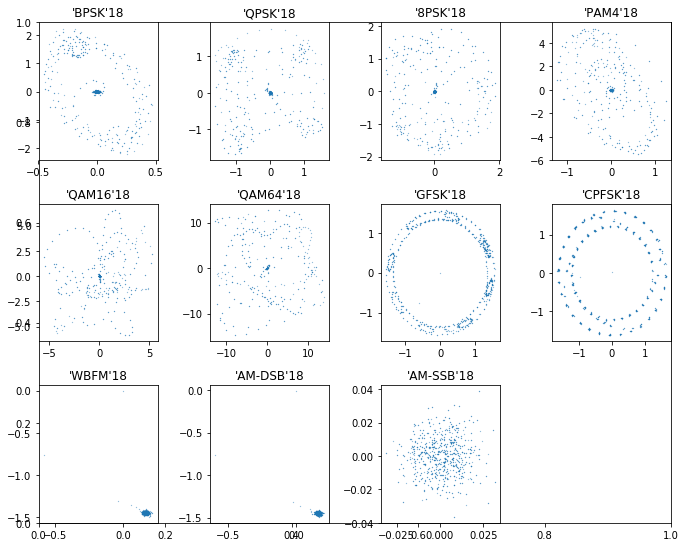

2016.10A： same scale


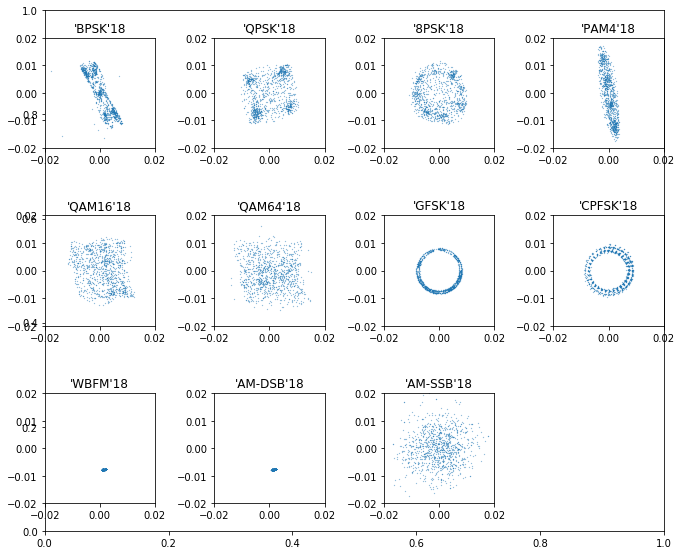

In [ ]:
_snr = 18
modtypes = [b'BPSK', b'QPSK', b'8PSK', b'PAM4', b'QAM16', b'QAM64', b'GFSK', b'CPFSK', b'WBFM', b'AM-DSB', b'AM-SSB']

print('2016.04C： different scales')
fig, ax = plt.subplots(figsize=(10,8)) 
for i, mod in enumerate(modtypes):
    ax = fig.add_subplot(3,4,i+1)
    plot_constellation(data, mod, _snr, num128pts=8, scale=False)
plt.show()


print('2016.10A： same scale')
fig, ax = plt.subplots(figsize=(10,8)) 
for i, mod in enumerate(modtypes):
    ax = fig.add_subplot(3,4,i+1)
    plot_constellation(data2, mod, _snr, num128pts=8, scale=True)
plt.show()

The pattern for each modulation can roughly be seen, particularly for the 2016.10A dataset (bottom) which have been scaled properly. The pattern is not so clear for the 2016.04C dataset (top) - even discounting the normalisation, the general pattern is also more noisy and less defined than the 2016.10A dataset. From now on, we will look only at the cleaner and more normalised **2016.10A** dataset.

## Clarity of constellation at different SNRs

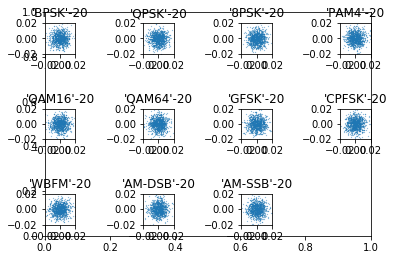

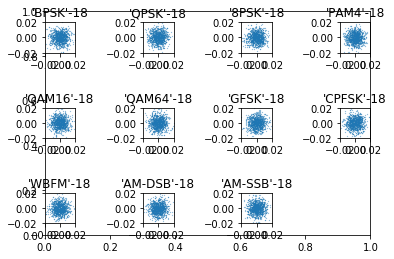

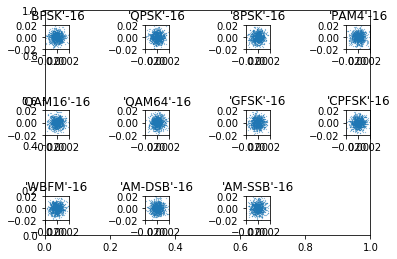

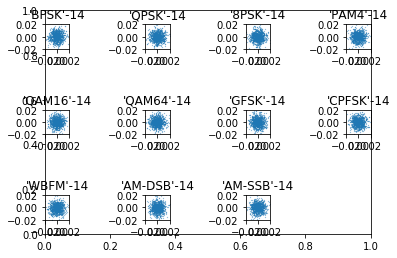

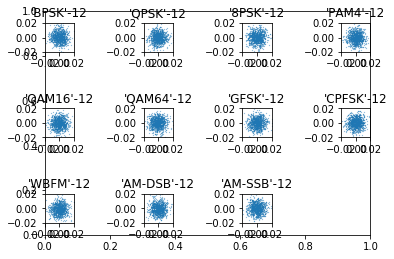

...

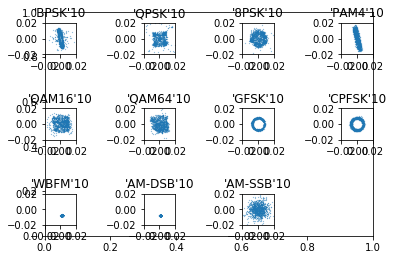

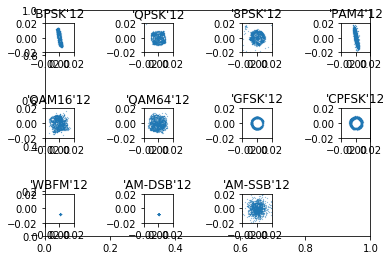

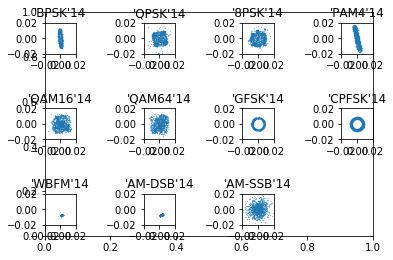

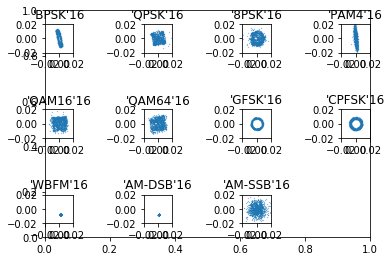

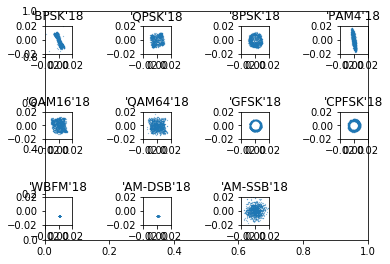

In [ ]:
snrs = [i for i in range(-20, 20, 2)]
modtypes = [b'BPSK', b'QPSK', b'8PSK', b'PAM4', b'QAM16', b'QAM64', b'GFSK', b'CPFSK', b'WBFM', b'AM-DSB', b'AM-SSB']

for _snr in snrs:
  fig, ax = plt.subplots() 

  for i, mod in enumerate(modtypes):
        ax = fig.add_subplot(3,4,i+1)
        plot_constellation(data2, mod, _snr, num128pts=8, scale=True)
  plt.show()

From roughly 0dB and below, the constellation plots become indistinguishable by naked eye. We can therefore infer that Deep Learning will also fail for low SNRs.

## Clarity of constellation with different number of points

Note that it might not be very valid to dump samples of 128 points unrelated in time together.
It is obvious that greater number of points produces more distinct constellations.

128 points


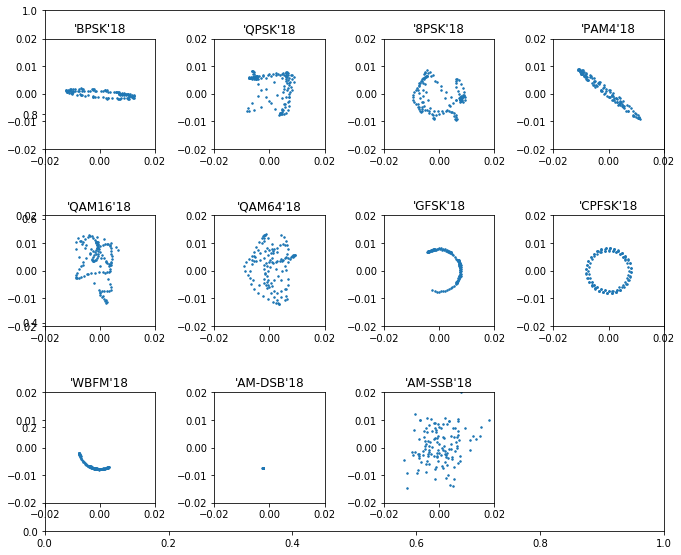

512 points


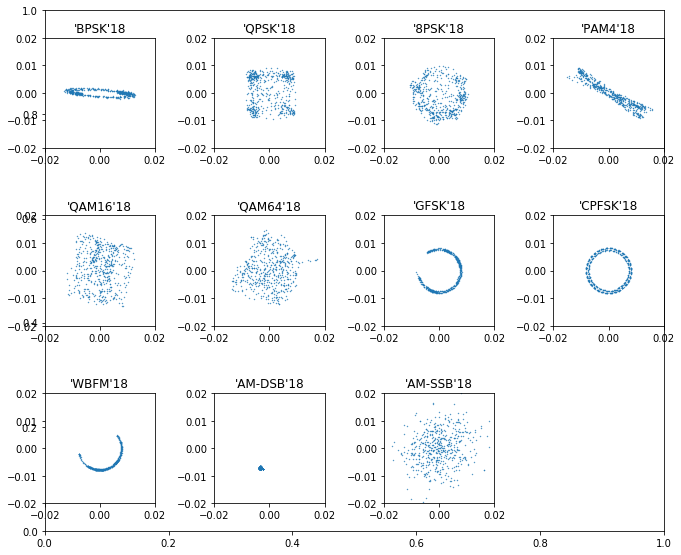

1024 points


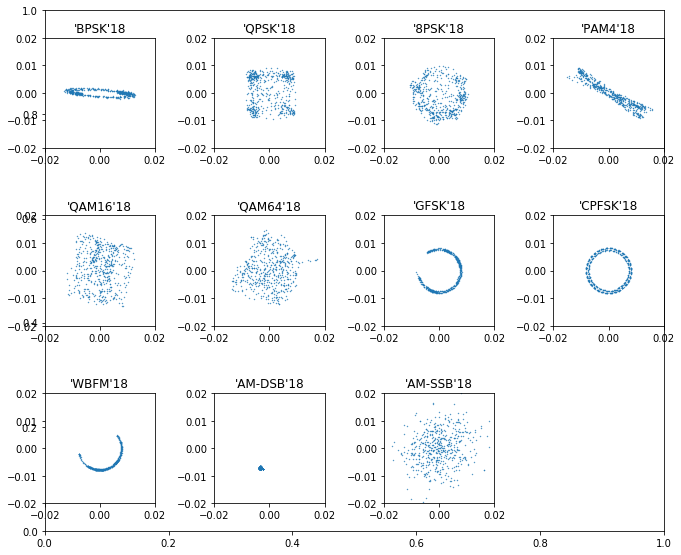

In [ ]:
_snr = 18

modtypes = [b'BPSK', b'QPSK', b'8PSK', b'PAM4', b'QAM16', b'QAM64', b'GFSK', b'CPFSK', b'WBFM', b'AM-DSB', b'AM-SSB']

print('128 points')
fig, ax = plt.subplots(figsize=(10,8)) 
for i, mod in enumerate(modtypes):
    ax = fig.add_subplot(3,4,i+1)
    plot_constellation(data2, mod, _snr, num128pts=1, scale=True, offset=100)
plt.show()

print('512 points')
fig, ax = plt.subplots(figsize=(10,8)) 
for i, mod in enumerate(modtypes):
    ax = fig.add_subplot(3,4,i+1)
    plot_constellation(data2, mod, _snr, num128pts=4, scale=True, offset=100)
plt.show()

print('1024 points')
fig, ax = plt.subplots(figsize=(10,8)) 
for i, mod in enumerate(modtypes):
    ax = fig.add_subplot(3,4,i+1)
    plot_constellation(data2, mod, _snr, num128pts=4, scale=True, offset=100)
plt.show()

128 points is sufficient to show circular patterns (GFSK, CPSK), and to some extent BPSK, PAM4. But QPSK, 8PSK, QAM16, QAM64 appear quite sparse. 128 points doesn't look too bad actually, but clarity improves with more points. Models will likely have different performances training on different data lengths.

##  Closer look at each modulation scheme

The digital modulations look correct, but the WBFM and AM-DSB modulations look wrong, as they appear to be just dots.

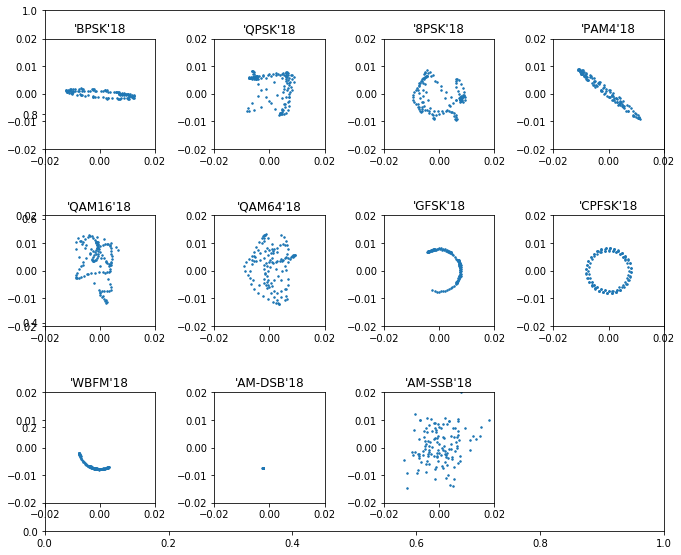

In [ ]:
modtypes = [b'BPSK', b'QPSK', b'8PSK', b'PAM4', b'QAM16', b'QAM64', b'GFSK', b'CPFSK', b'WBFM', b'AM-DSB', b'AM-SSB']

fig, ax = plt.subplots(figsize=(10,8)) 
for i, mod in enumerate(modtypes):
    ax = fig.add_subplot(3,4,i+1)
    plot_constellation(data2, mod, _snr, num128pts=1, scale=True, offset=100)
plt.show()


### Digital modulation
The first two rows show digital modulations, where we expect data to only occupy discrete points on the 2D plane according to the M-ary modulation scheme. This is easy to see when M is small and the discree points are spaced far apart, but for QAM16 and QAM64 it is very easy to confuse them, even for the highest SNR of 18dB. 

Also considering that some modulation schemes are subsets of each other, i.e. points on QPSK belong to 8PSK, there might be some confusion between them, but should be solvable if the number of data points is large enough.

GFSK and CPFSK can be distinguished by the thickness of the circle, and the evenness in density throughout the circle. Since CPFSK is continuous phase, it has greater continuity along the circumference. 

### Problems with analogue signals dataset

The last row shows analogue modulation. They should occupy a continuous set of points. 

However, oddly only AM-SSB exhibits this characteristic with a random cloud of points (random amplitudes and phases). On the other hand, WBFM and AM-DSB are just dots for some samples because they are taken from speech recordings with pauses in the middle, so signal is absent. Below, we show the constellations for analogue modulation for different samples to show that for some samples, AM-DSB is the same as WBFM.

no signal


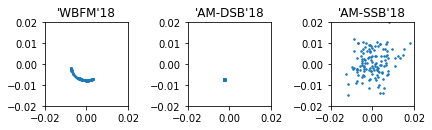

signal present


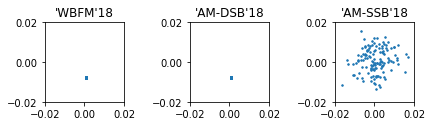

all samples dumped together - 128k points


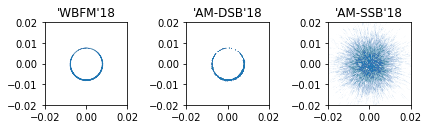

In [ ]:
snr = 16

print('no signal')
plt.figure(1)
plt.subplot(1, 3, 1)
plot_constellation(data2, b'WBFM', _snr, num128pts=1, scale=True, offset=100)
plt.subplot(1, 3, 2)
plot_constellation(data2, b'AM-DSB', _snr, num128pts=1, scale=True, offset=100)
plt.subplot(1, 3, 3)
plot_constellation(data2, b'AM-SSB', _snr, num128pts=1, scale=True, offset=100)
plt.show()

print('signal present')
plt.figure(2)
plt.subplot(1, 3, 1)
plot_constellation(data2, b'WBFM', _snr, num128pts=1, scale=True, offset=0)
plt.subplot(1, 3, 2)
plot_constellation(data2, b'AM-DSB', _snr, num128pts=1, scale=True, offset=0)
plt.subplot(1, 3, 3)
plot_constellation(data2, b'AM-SSB', _snr, num128pts=1, scale=True, offset=0)
plt.show()

print('all samples dumped together - 128k points')
plt.figure(2)
plt.subplot(1, 3, 1)
plot_constellation(data2, b'WBFM', _snr, num128pts=1000, scale=True, offset=0)
plt.subplot(1, 3, 2)
plot_constellation(data2, b'AM-DSB', _snr, num128pts=1000, scale=True, offset=0)
plt.subplot(1, 3, 3)
plot_constellation(data2, b'AM-SSB', _snr, num128pts=1000, scale=True, offset=0)
plt.show()

WBFM looks correct because we expect the phase to change at different rates with amplitude constant. 

Not sure why AM-DSB is just a dot instead of a line passing through origin - perhaps the phase might not be constant since speech might contain different phases which influences the AM mod, but the amplitude should be varying? Even with all the samples dumped together, we still don't see any amplitude variation...

AM-SSB is always a random cloud no matter what, I think because removing a sideband, Hilbert transform, turns the originally real signal into complex numbers?

Let's look at the analogue signals in more detail to understand whether there is really a problem.

#### Analogue further investigation in time domain

I/Q in time and Amplitude/phase in time
Offset=0


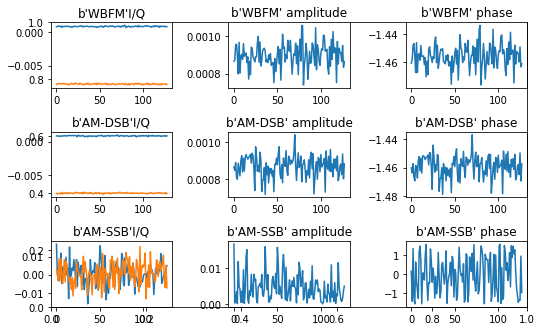

Offset=100


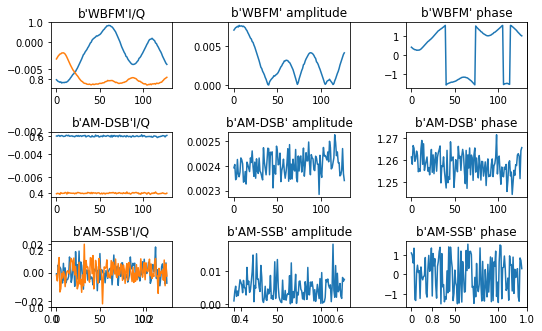

Offset=300


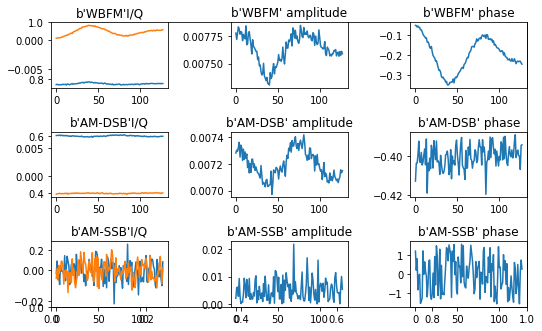

In [ ]:
snr = 16

modtypes = [b'WBFM', b'AM-DSB', b'AM-SSB']

print('I/Q in time and Amplitude/phase in time')

print('Offset=0')
offset = 0
fig, ax = plt.subplots(figsize=(8,5)) 
for i, mod in enumerate(modtypes):
    I = data2[(mod, _snr)][offset][0]
    Q = data2[(mod, _snr)][offset][1]
    ax = fig.add_subplot(3,3,3*i+1)
    plt.plot(I)
    plt.plot(Q)
    plt.title(str(mod) + 'I/Q')
    plt.tight_layout()
    
    amp = np.sqrt(np.square(I), np.square(Q))
    phase = np.arctan(np.divide(Q, I))
    ax = fig.add_subplot(3,3,3*i+2)
    plt.plot(amp)
    plt.title(str(mod) + ' amplitude')
    plt.tight_layout()
    
    ax = fig.add_subplot(3,3,3*i+3)
    plt.plot(phase)
    plt.title(str(mod) +' phase')
    plt.tight_layout()
plt.show()


print('Offset=100')
offset = 100
fig, ax = plt.subplots(figsize=(8,5)) 
for i, mod in enumerate(modtypes):
    I = data2[(mod, _snr)][offset][0]
    Q = data2[(mod, _snr)][offset][1]
    ax = fig.add_subplot(3,3,3*i+1)
    plt.plot(I)
    plt.plot(Q)
    plt.title(str(mod) + 'I/Q')
    plt.tight_layout()
    
    amp = np.sqrt(np.square(I), np.square(Q))
    phase = np.arctan(np.divide(Q, I))
    ax = fig.add_subplot(3,3,3*i+2)
    plt.plot(amp)
    plt.title(str(mod) + ' amplitude')
    plt.tight_layout()
    
    ax = fig.add_subplot(3,3,3*i+3)
    plt.plot(phase)
    plt.title(str(mod) +' phase')
    plt.tight_layout()
plt.show()



print('Offset=300')
offset = 300
fig, ax = plt.subplots(figsize=(8,5)) 
for i, mod in enumerate(modtypes):
    I = data2[(mod, _snr)][offset][0]
    Q = data2[(mod, _snr)][offset][1]
    ax = fig.add_subplot(3,3,3*i+1)
    plt.plot(I)
    plt.plot(Q)
    plt.title(str(mod) + 'I/Q')
    plt.tight_layout()
    
    amp = np.sqrt(np.square(I), np.square(Q))
    phase = np.arctan(np.divide(Q, I))
    ax = fig.add_subplot(3,3,3*i+2)
    plt.plot(amp)
    plt.title(str(mod) + ' amplitude')
    plt.tight_layout()
    
    ax = fig.add_subplot(3,3,3*i+3)
    plt.plot(phase)
    plt.title(str(mod) +' phase')
    plt.tight_layout()
plt.show()

Confirms that AM-DSB amplitude doesn't quite change. Even when it appears to have envelope for offset=300, the variation in amplitude is very very small.

It might be more appropriate to entirely remove analogue modulations from this dataset.

## View modulations in I/Q time domain

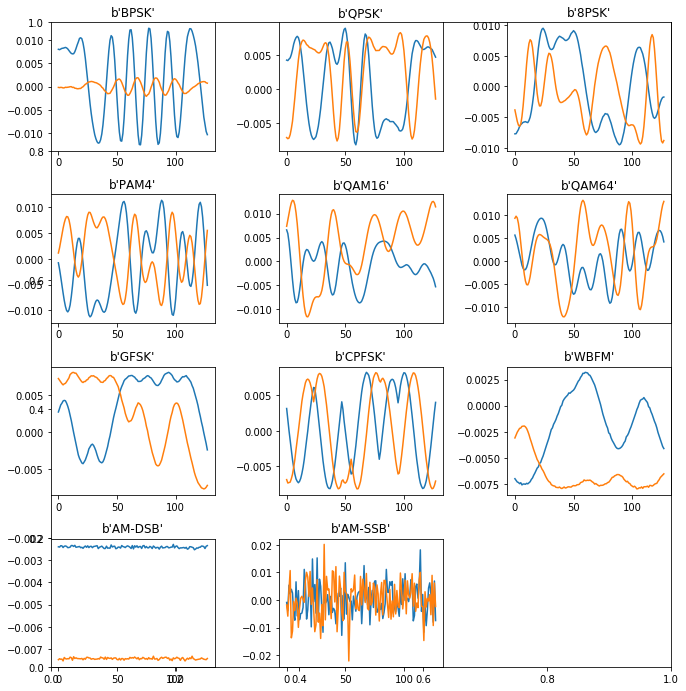

In [ ]:
_snr = 18
offset = 100
modtypes = [b'BPSK', b'QPSK', b'8PSK', b'PAM4', b'QAM16', b'QAM64', b'GFSK', b'CPFSK', b'WBFM', b'AM-DSB', b'AM-SSB']

fig, ax = plt.subplots(figsize=(10,10)) 
for i, mod in enumerate(modtypes):
    I = data2[(mod, _snr)][offset][0]
    Q = data2[(mod, _snr)][offset][1]
    ax = fig.add_subplot(4,3,i+1)
    plt.plot(I)
    plt.plot(Q)
    plt.title(mod)
    plt.tight_layout()
plt.show()

BPSK and QPSK are clearly as expected, with one amplitude value, and BPSK has the one component = 0 always. 8PSK should also have one amplitude but not so clear from diagram. 

QAM exhibits different amplitude levels.

The others cannot really tell. SSB just looks like random noise.

## View Amplitude and Phase in time

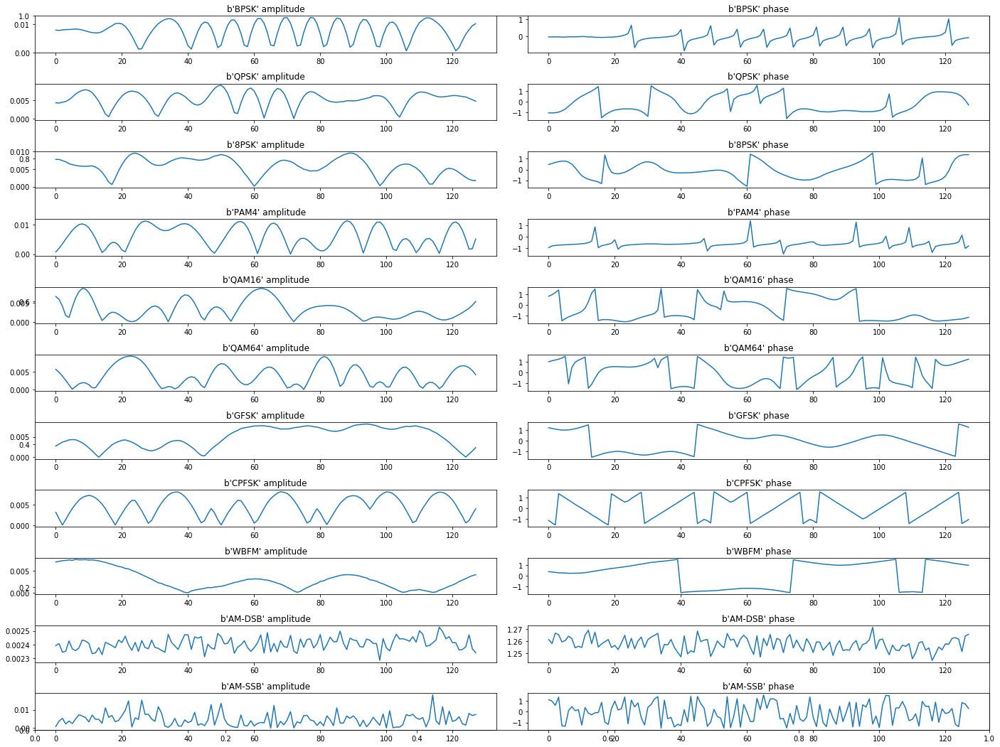

In [ ]:
_snr = 18
offset = 100
modtypes = [b'BPSK', b'QPSK', b'8PSK', b'PAM4', b'QAM16', b'QAM64', b'GFSK', b'CPFSK', b'WBFM', b'AM-DSB', b'AM-SSB']


fig, ax = plt.subplots(figsize=(20,15)) 
for i, mod in enumerate(modtypes):
    I = data2[(mod, _snr)][offset][0]
    Q = data2[(mod, _snr)][offset][1]
    amp = np.sqrt(np.square(I), np.square(Q))
    phase = np.arctan(np.divide(Q, I))
    ax = fig.add_subplot(11,2,2*i+1)
    plt.plot(amp)
    plt.title(str(mod) + ' amplitude')
    plt.tight_layout()
    
    ax = fig.add_subplot(11,2,2*i+2)
    plt.plot(phase)
    plt.title(str(mod) +' phase')
    plt.tight_layout()
plt.show()

Don't really observe anything from amplitude and phase. Phase plots very different for amplitude and phase modulation.

## View power density spectra

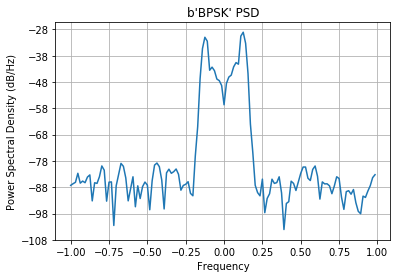

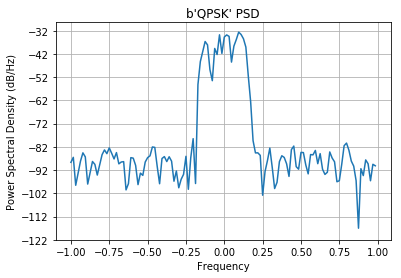

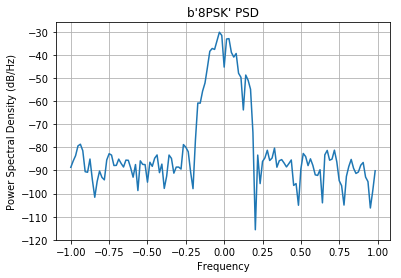

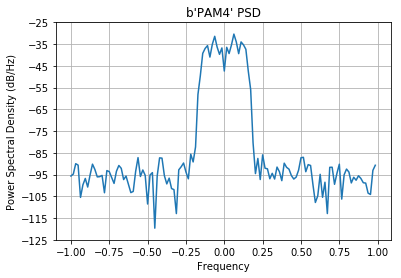

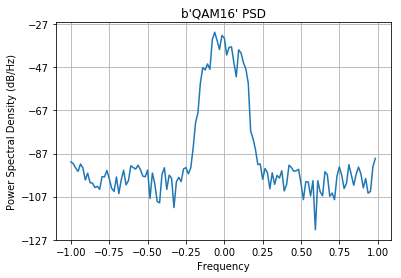

...

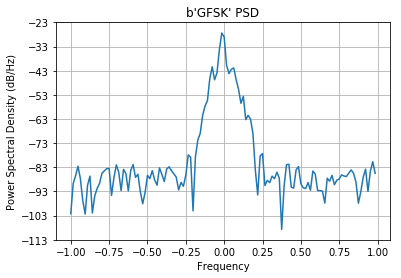

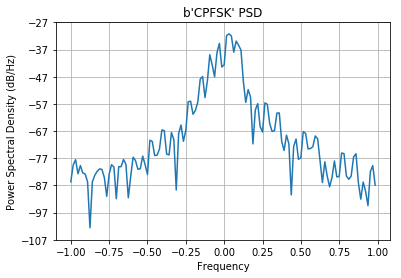

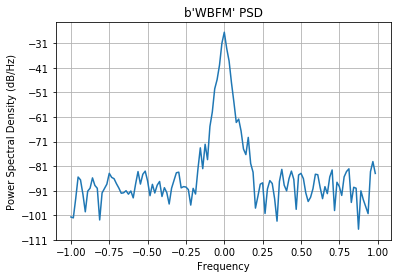

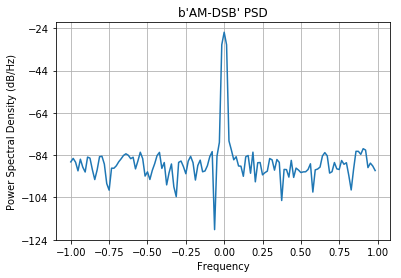

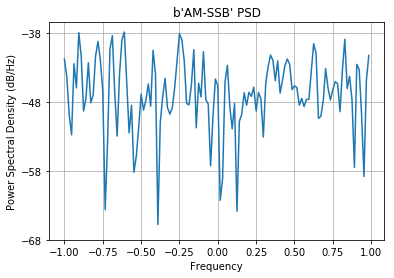

<Figure size 432x288 with 0 Axes>

In [ ]:
_snr = 18
offset = 100
modtypes = [b'BPSK', b'QPSK', b'8PSK', b'PAM4', b'QAM16', b'QAM64', b'GFSK', b'CPFSK', b'WBFM', b'AM-DSB', b'AM-SSB']


for n, mod in enumerate(modtypes):
    I = data2[(mod, _snr)][offset][0]
    Q = data2[(mod, _snr)][offset][1]
    cmplx = [complex(I[k], Q[k]) for k in range(len(I))]
    
    plt.psd(cmplx, NFFT=128) #anyhow set Fs
    plt.title(str(mod) + ' PSD')
    plt.show() 
    plt.tight_layout()
plt.show()

A lot of papers say freq spectrum not very useful

# Quick visualisation of 2018 radioML dataset

This file is really large, takes some time to download and might overload RAM if you try loading it. The original copy from https://www.deepsig.ai/datasets had a txt file containing the order of the classes which was wrong. I couldn't figure out how to load the file from the original dataset, but this [Medium tutorial](https://medium.com/gsi-technology/residual-neural-networks-in-python-1796a57c2d7) provides a smaller subset of the dataset formatted in a list form instead of a dictionary form but it was unlabelled. So what I'm visualising now is the smaller subset from that tutorial, labelled with the wrong classes in the txt file from the original site which I then combined into a python dictionary of the same form as the 2016 dataset.

I thought this dataset had a lot of potential because it contained more classes of modulation (24) with 11 easier ones and 13 harder ones, but I can't really do any analysis when the classes are labelled wrongly. So I suggest don't even need to bother with trying this.

In [ ]:
from sklearn.externals import joblib
filename = 'radioML2018_dict.hdf5'
data_2018 = joblib.load(filename)  

In [ ]:
fig, ax = plt.subplots(figsize=(10,16))
offset = 1
for k in range(len(classlist)):
    plt.subplot(6, 4, k+1)
    I = data_2018[(classlist[k], 30)][offset][:,0]
    Q = data_2018[(classlist[k], 30)][offset][:,1]
    plt.plot(I,Q, '.', markersize=1)
    plt.xlim(-2,2)
    plt.ylim(-2,2)
    plt.title(classlist[k])
    plt.tight_layout()
plt.show()

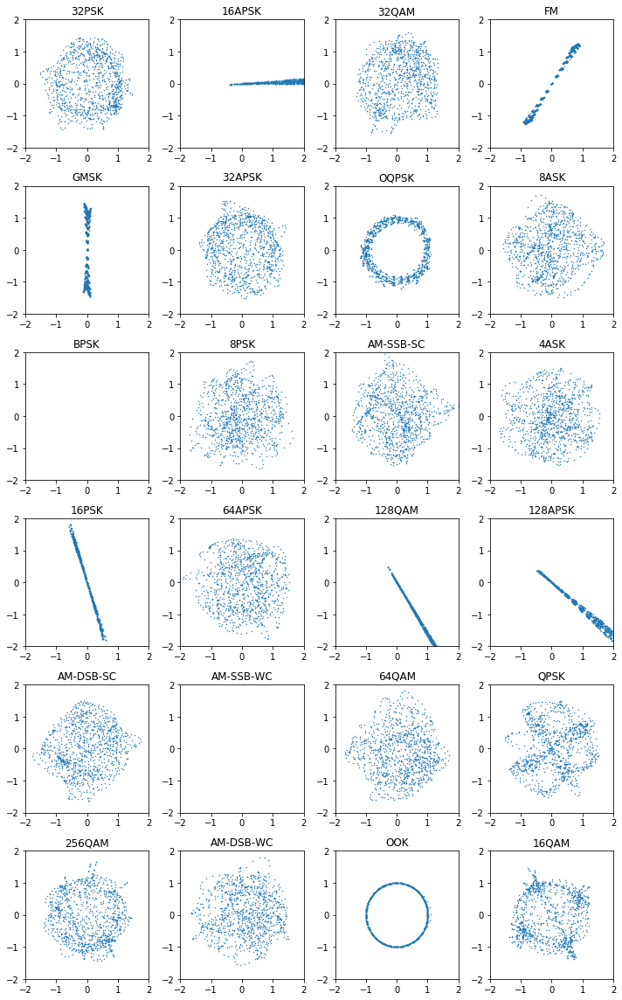

In [ ]:
fig, ax = plt.subplots(figsize=(10,16))
offset = 1
for k in range(len(classlist)):
    plt.subplot(6, 4, k+1)
    I = data_2018[(classlist[k], 30)][offset][:,0]
    Q = data_2018[(classlist[k], 30)][offset][:,1]
    plt.plot(I,Q, '.', markersize=1)
    plt.xlim(-2,2)
    plt.ylim(-2,2)
    plt.title(classlist[k])
    plt.tight_layout()
plt.show()

Very hard to distinguish by eye and correct the classes.

# Matlab dataset

I created 3 datasets with different levels of clarity, all with SNRs from -10 to 30dB, with 8 digital modulations same as that of the 2016 radioML dataset. The easy dataset only had AWGN, the medum dataset had AWGN + Rician Fading + light clock offset (1ppb), the hard dataset had AWGN + Rician Fading + clock offset(5ppm) + Doppler effect(4Hz). The exact significance of these parameters can be understood in the [Matlab tutorial](https://www.mathworks.com/help/deeplearning/ug/modulation-classification-with-deeplearning.html#ModulationClassificationWithDeepLearningExample-2).

I initially created only the hard dataset which was supposed to represent realistic conditions. After visualising the constellations from the hard dataset at 30dB, I realised that all the constellations were distorted and undiscernable and I thought that the models might completely fail on the hard dataset, so I decided to create easier datasets to get some positive results first.

It turns out that even for the easy dataset which does not contain any channel effects, the dataset looked noisier than that from the 2016 radioML dataset. Somehow the 18dB from the radioML dataset is different from the 18dB from the Matlab dataset. This highlights the importance of having a benchmark dataset for academia to compare their algorithms fairly. Also another insight is that the radioML dataset is far too clean and it is likely that algorithms working well on radioML dataset might not work well in real-life scenarios.

In [ ]:
def plot_constellation(dataset, mod, snr, offset=0, scale=False):
  points = dataset[(mod, snr)][offset]

  marksz = max(0.01, 1)
  plt.plot(points[0], points[1], '.', markersize=marksz)
  plt.title(str(mod) + str(snr))
  plt.tight_layout()
  if (scale):
        plt.xlim(-0.05, 0.05)
        plt.ylim(-0.05, 0.05)
        plt.gca().set_aspect('equal', adjustable='box')
  return points

The Matlab dataset contains 1024x2 time series samples. I had it longer than 128 as in radioML 2016 dataset, so if we want to extract 128 samples or shorter samples for training it is also possible.

128 points


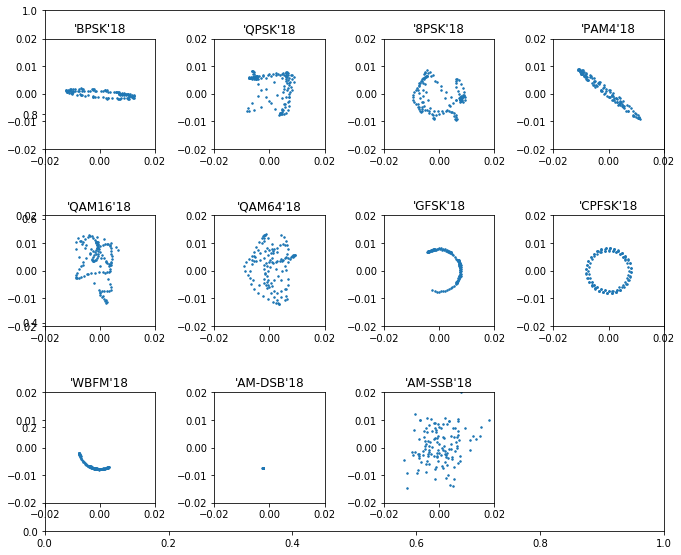

512 points


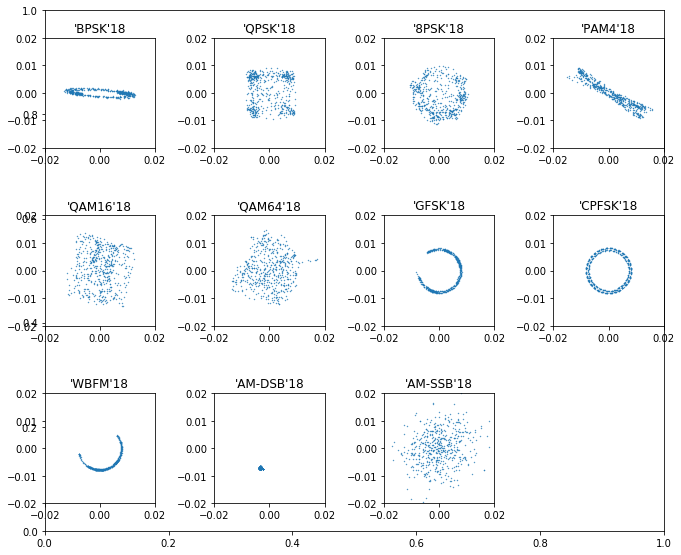

1024 points


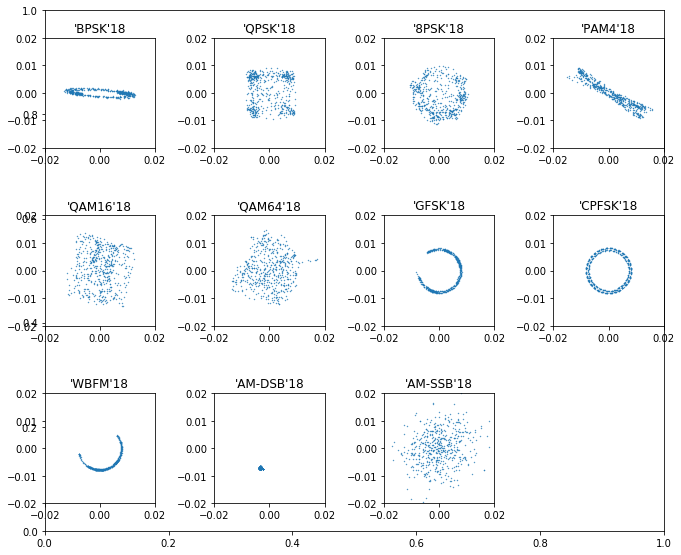

In [ ]:
#Here is the constellations from radioML 2016 for comparison later:

## Ｅasy dataset
Only AWGN, no other channel effects present.

In [ ]:
from sklearn.externals import joblib
data_easy = joblib.load('data/matlab_dict_easy.hdf5')

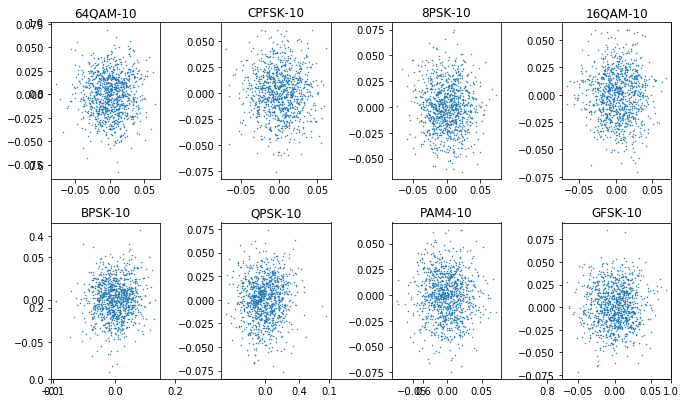

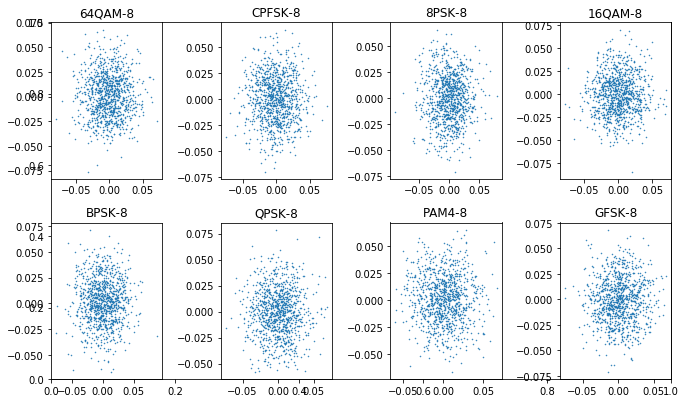

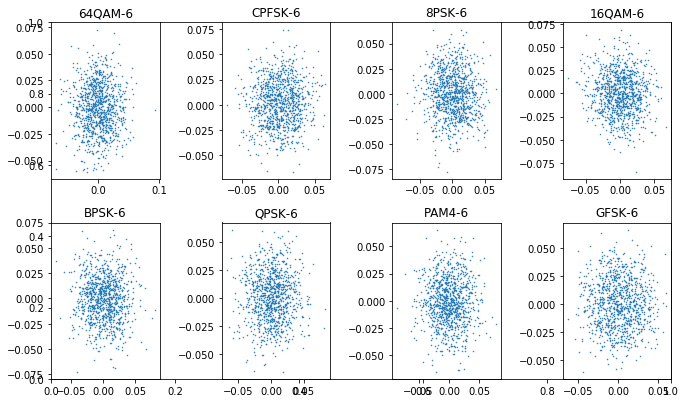

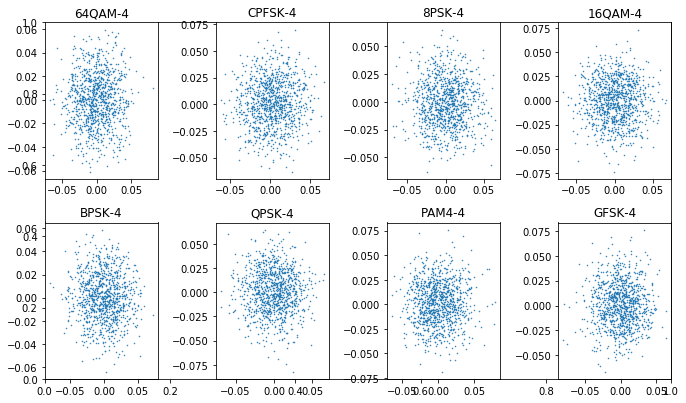

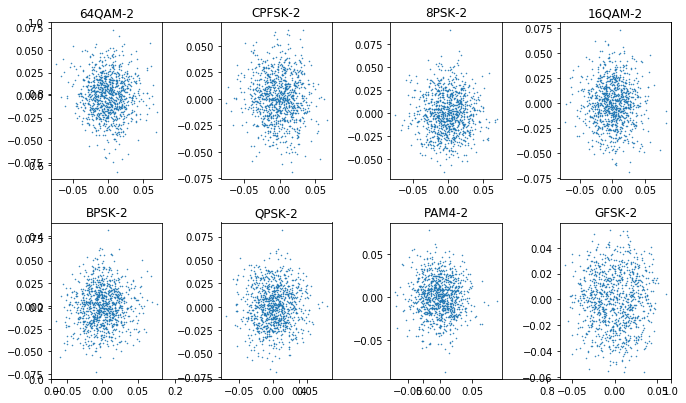

...

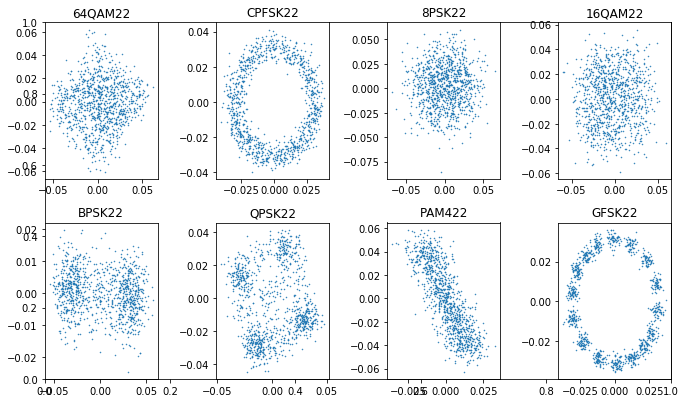

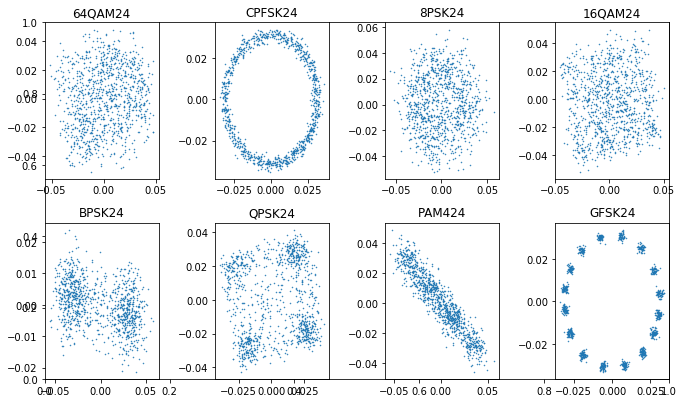

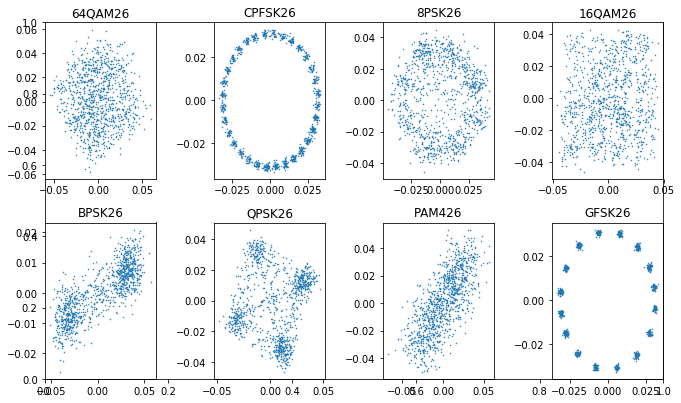

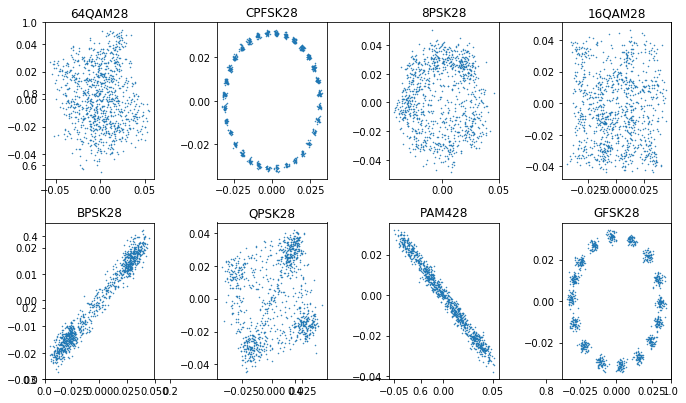

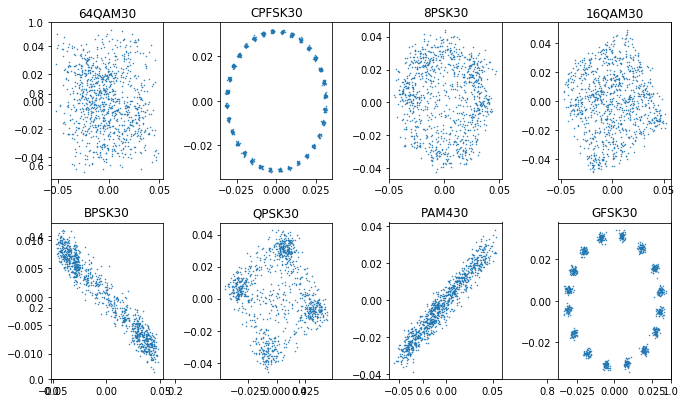

In [ ]:
snrs = [i for i in range(-10, 31, 2)]
directory = 'easy'
modtypes = os.listdir(directory)

for _snr in snrs:
  fig, ax = plt.subplots(figsize=(10,6)) 

  for i, mod in enumerate(modtypes):
        ax = fig.add_subplot(2,4,i+1)
        plot_constellation(data_easy, mod, _snr)
  plt.show()

Even after I normalised the datasets to unit power, the scale is different from radioML 2016. But the constellation patterns look quite similar to radioML, except that the FSKs are more discrete here but for radioML they looked more continuous along the circumference. And also the exact starting phases change.

## Medium dataset
AWGN + Rician Fading + light clock offset

In [ ]:
data_med = joblib.load('data/matlab_dict_medium.hdf5')

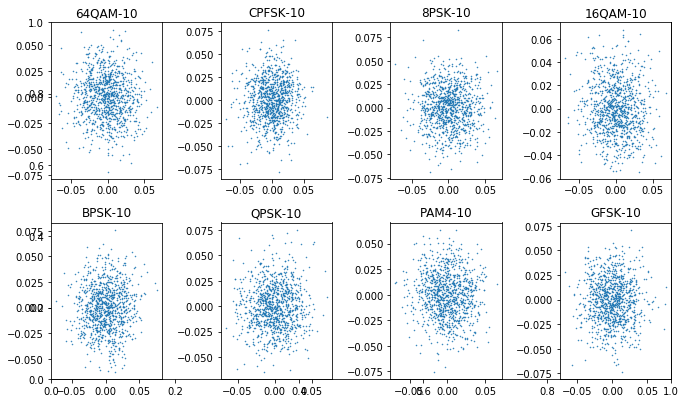

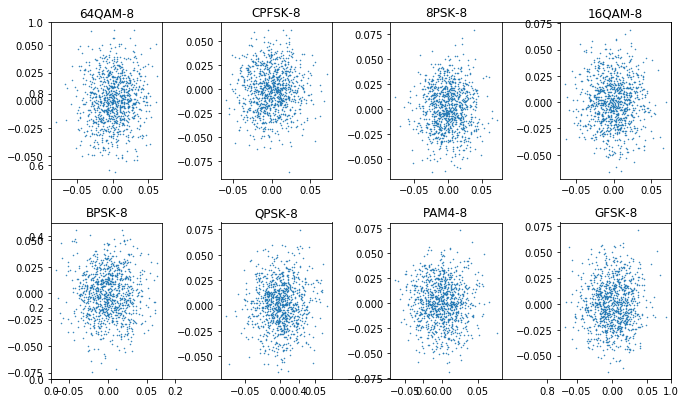

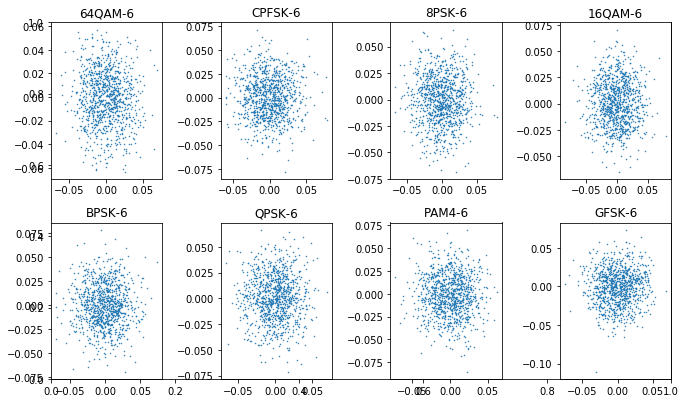

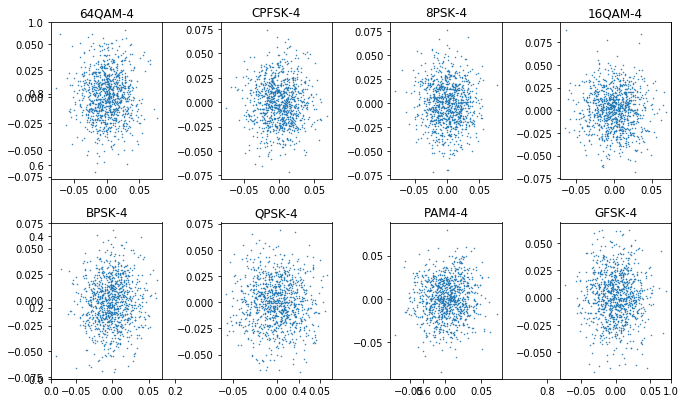

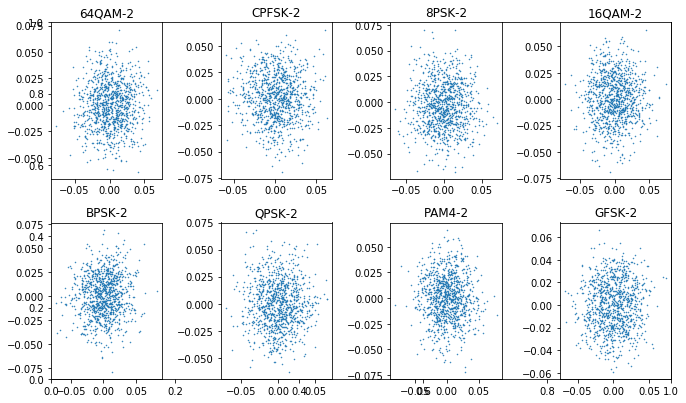

...

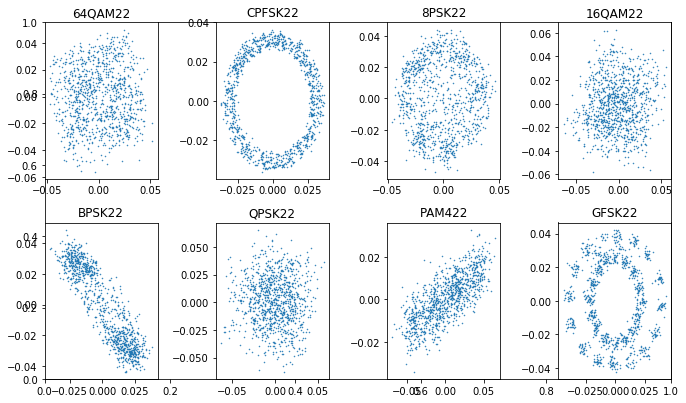

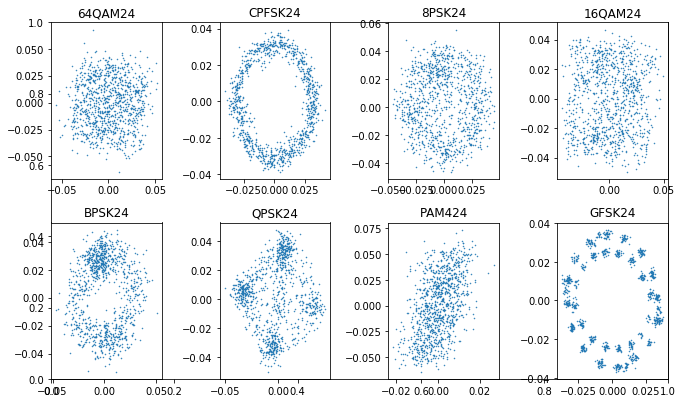

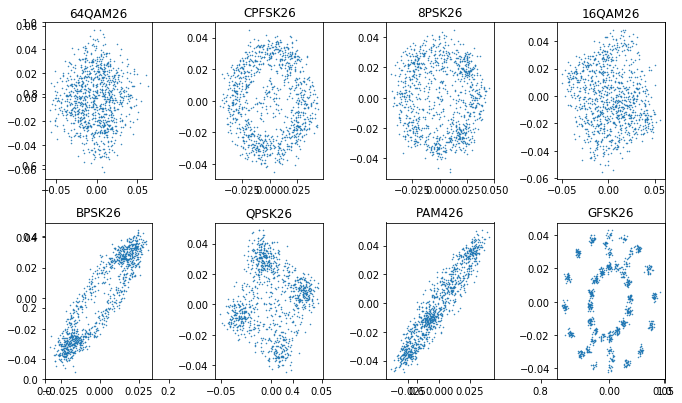

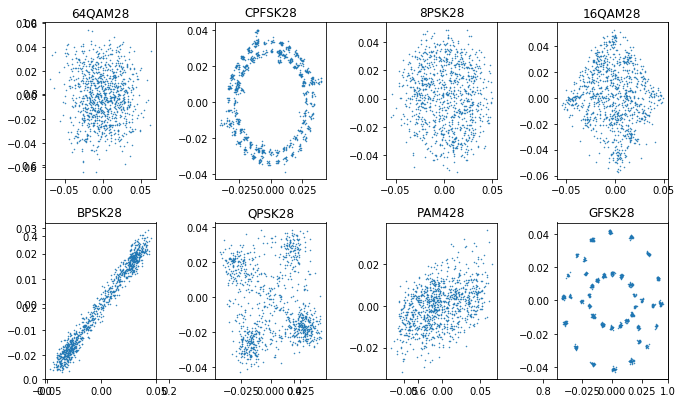

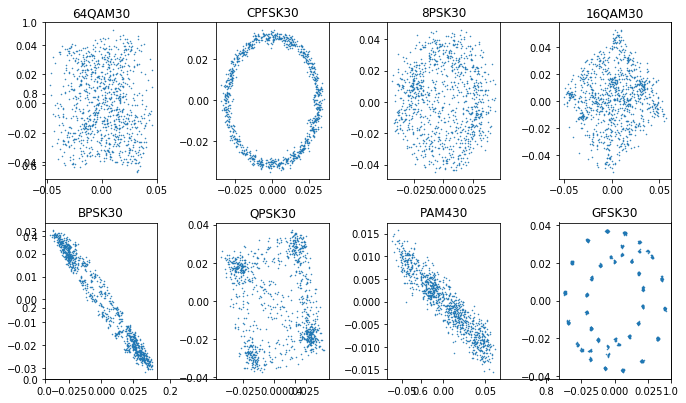

In [ ]:
snrs = [i for i in range(-10, 31, 2)]
directory = 'easy'
modtypes = os.listdir(directory)

for _snr in snrs:
  fig, ax = plt.subplots(figsize=(10,6)) 

  for i, mod in enumerate(modtypes):
        ax = fig.add_subplot(2,4,i+1)
        plot_constellation(data_med, mod, _snr)
  plt.show()

A bit more distortion than the easy dataset, but still discernible at high SNRs.

## Hard dataset
AWGN + Rician Fading + clock offset + Doppler effect

In [ ]:
data_hard = joblib.load('data/matlab_dict_hard.hdf5')

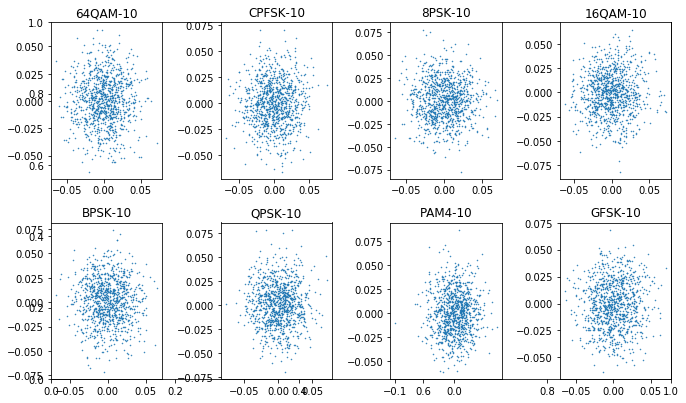

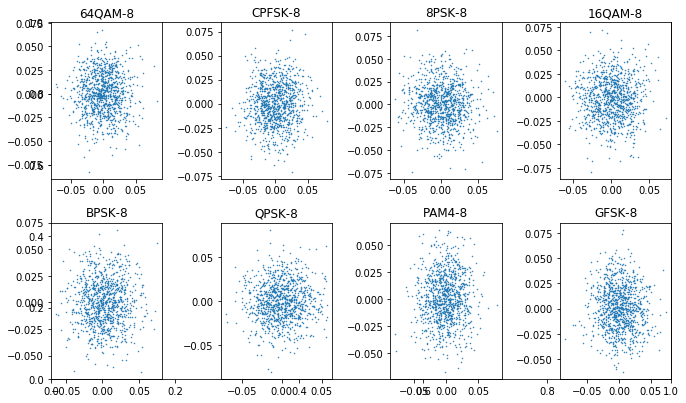

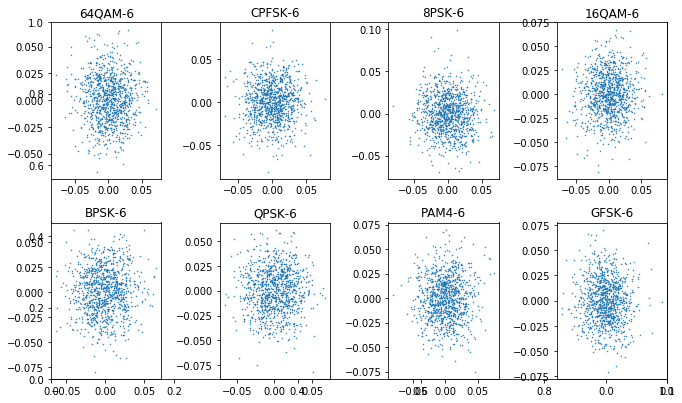

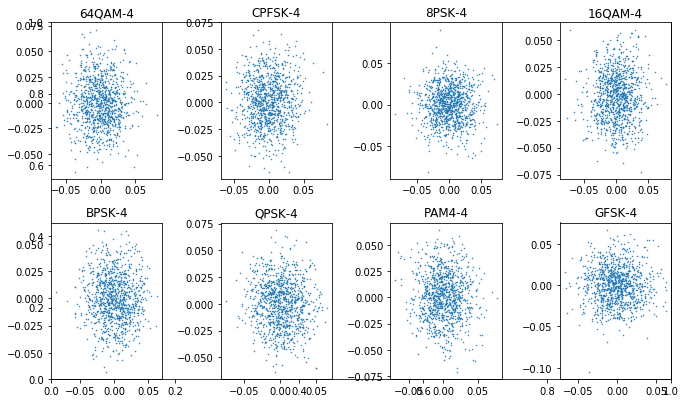

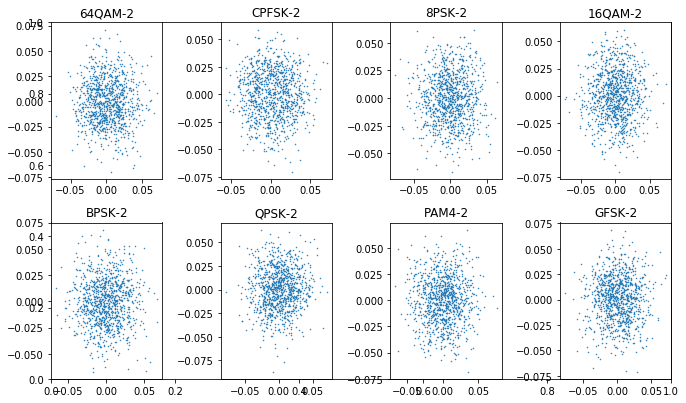

...

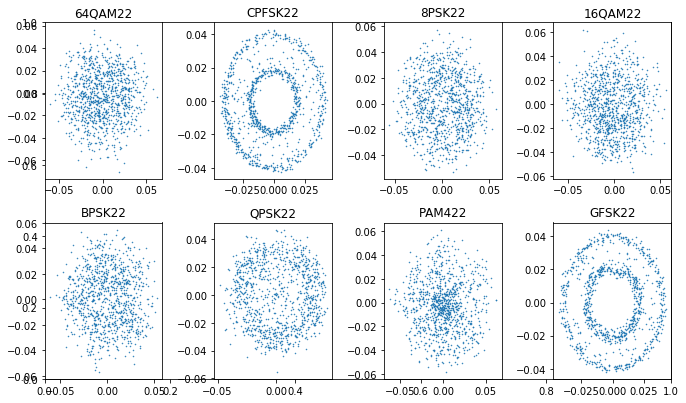

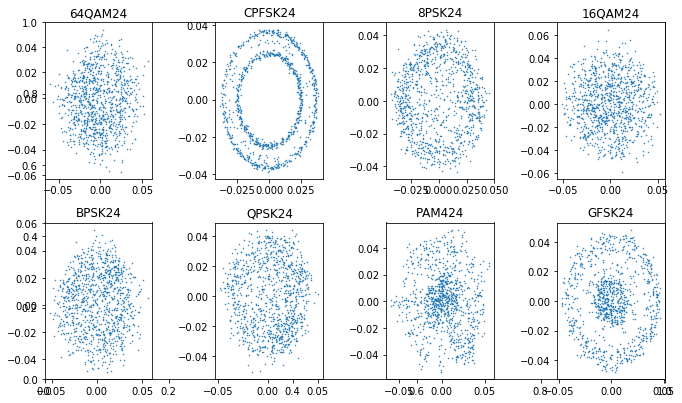

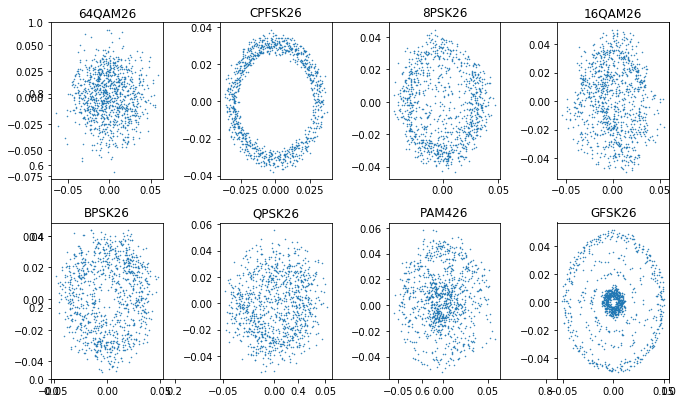

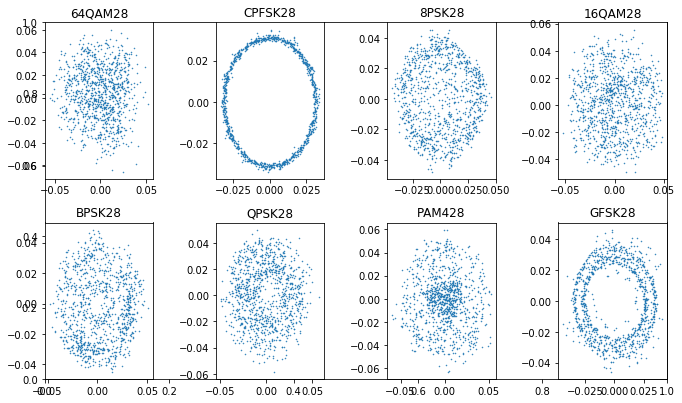

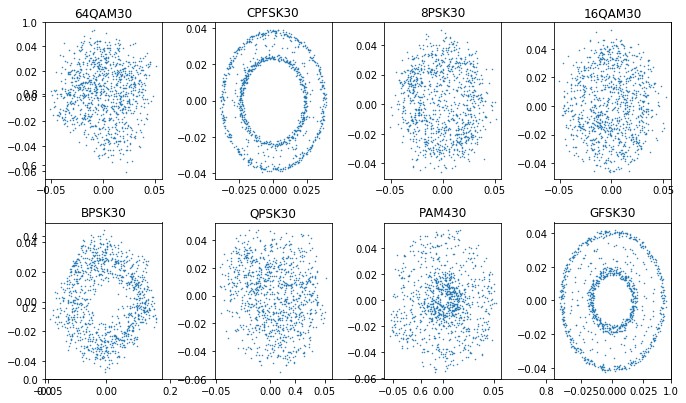

In [ ]:
snrs = [i for i in range(-10, 31, 2)]
directory = 'easy'
modtypes = os.listdir(directory)

for _snr in snrs:
  fig, ax = plt.subplots(figsize=(10,6)) 

  for i, mod in enumerate(modtypes):
        ax = fig.add_subplot(2,4,i+1)
        plot_constellation(data_hard, mod, _snr)
  plt.show()

Very hard to discern even at 30dB, and this is supposed to simulate real-life conditions. Even the BPSK doesn't look like BPSK. Doesn't look optimistic that the model can actually differentiate them. This is why it is important to try whether models work on different datasets.

# New representation: coloured constellation density plots

Some papers say that constellation plots coloured according to point density improves CNN classification accuracy, because CNN works well with images in three channels.

To generate the coloured constellation image, I bin the I and Q values into 128 bins each from the range of -0.02 to 0.02 (for radioML dataset) and -0.05 to 0.05 (for Matlab dataset), resulting in 128x128 bin locations. Then, I count the number of points falling into each bin using Matplotlib's hist2d function. Subsequently, I use the 'hot' colourmap to convert the bin counts into colour, with white representing the highest density of points, and black representing the lowest density.

In [ ]:
def plot_col2_constellation(dataset, mod, snr, num128pts=1, offset=0, nbins=128):
    modtype = dataset[(mod, snr)]
    points_i = []
    points_q = []
    points = [points_i, points_q]
    for i in range(num128pts):
        for j in range(128):
            points[0].append(modtype[i + offset][0][j])
            points[1].append(modtype[i + offset][1][j])
            
    ar = plt.hist2d(points[0], points[1], bins=nbins, cmap='hot', range = [[-0.02, 0.02], [-0.02, 0.02]])

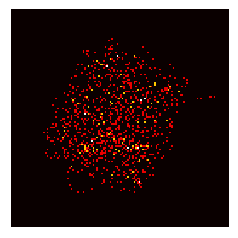

In [ ]:
fig, ax = plt.subplots()
plot_col2_constellation(data2, b'QAM64', 18, num128pts=8, offset=100)

plt.axis('off')
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
plt.gca().set_aspect('equal', adjustable='box')
plt.savefig('test.png', bbox_inches='tight', pad_inches=0, dpi=40)

This is how QAM64 looks like in coloured form.

In [ ]:
#run this code to create array of coloured image 

xyrange = 0.02 #0.05 for matlab data, this sets the region in complex plane to be captured
counts, xedges, yedges = np.histogram2d(inphase, quadrature, bins=b,range = [[-xyrange, xyrange], [-xyrange, xyrange]])
def arr2img(arr, chnum):
    norm = plt.Normalize(vmin=arr.min(), vmax=arr.max())
    if chnum == 1:
        cmap = plt.cm.gray
        image4d = cmap(norm(arr)) #RGBA
        img = image4d[:,:,0] #All RGBA channels identical
    elif chnum == 3:
        cmap = plt.cm.hot #or can choose any other colormap
        image4d = cmap(norm(arr)) #RGBA
        img = image4d[:,:,:3] #ignore A channel
    
    return img